# Data Generation for the Rummy Pool

In [1]:
import random
import string
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
import warnings
warnings.filterwarnings('ignore')



number_of_players_in_pool = int(input('How many players do you want to have in the pool: '))
bet_multiplier_options = [0.05, 0.1, 0.25, 0.5, 1, 2, 3, 5, 10, 20, 40, 80, 125, 200]
min_amount = [4, 8, 20, 40, 80, 160, 240, 400, 800, 1600, 3200, 6400, 10000, 16000]
bet_min = dict(zip(bet_multiplier_options, min_amount))
print(bet_min)

bet_multiplier_input = float(input("How much do you want the bet amount multiplier to be?\nChoose from the options - (0.05, 0.1, 0.25, 0.5, 1, 2, 3, 5, 10, 20, 40, 80, 125, 200): "))
print(f"You have chosen the bet amount multiplier to be: {bet_multiplier_input}")

for key in bet_min.keys():
    if key == bet_multiplier_input:
        min_amt_required = float(bet_min[key])
        print("Minimum amount is:", min_amt_required)
        print(type(min_amt_required))
    else:
        continue
        print("Sorry, you have chosen a wrong bet amount multiplier, please try again by chosing one from the options mentioned here (0.05, 0.1, 0.25, 0.5, 1, 2, 3,5, 10, 20, 40, 80, 125, 200): ")

totalPlayers = {}
for i in range(number_of_players_in_pool):
    x = ''.join([random.choice(string.ascii_uppercase) for k in range(4)]).title()
    y = round(random.uniform(min_amt_required, (min_amt_required + 30)), 3)
    totalPlayers[x] = y

Sum = sum(totalPlayers.values())
print(f"The total amount involved in this pool is: {Sum}")
total_players_df = pd.DataFrame(totalPlayers.items(), columns=['Name', 'Balance in Rupees'])
print("The below table shows all the players in the pool along with their account balances.")
print(total_players_df)

total_amount_credited_to_app = 0
percentage_deduction = 15 / 100



matches_data = []

def matches():
    global total_amount_credited_to_app
    global matches_data

    eligible_players = {k: v for k, v in totalPlayers.items() if v >= min_amt_required}

    if len(eligible_players) < 2:
        print("Insufficient eligible players for a match.")
        return

    p1 = random.choice(list(eligible_players.items()))
    del eligible_players[p1[0]]
    p2 = random.choice(list(eligible_players.items()))

    match_data = {
        'Match Number':'',
        'Player 1': p1[0],
        'Player 2': p2[0],
        'Loser': '',
        'Winner': '',
        'Points Lost by Loser': '',
        'Amount Lost by Loser': '',
        'Amount Remaining for Loser': '',
        'Amount to be Credited to App': '',
        'Total Amount Earned by App': '',
        'Amount Won by Winner': '',
        'Amount Remaining for Winner': ''
    }
    
    match_data['Match Number'] = len(matches_data) + 1
    
    remaining_balances = totalPlayers.copy()
    for player, balance in remaining_balances.items():
        if player == match_data['Loser']:
            match_data[player] = totalPlayers[player] - (random.randint(2, 80) * bet_multiplier_input)
        elif player == match_data['Winner']:
            match_data[player] = totalPlayers[player] + (
                        totalPlayers[match_data['Loser']] * bet_multiplier_input * (100 - percentage_deduction) / 100)
        else:
            match_data[player] = balance
    
    for players, remaining_bal in totalPlayers.items():
        if players == match_data['Loser']:
            match_data[players] = amount_remaining_for_loser
        elif players == match_data['Winner']:
            match_data[players] == amount_remaining_for_winner
        else:
            match_data[players] == remaining_bal
    
    match_data['Loser'] = p1[0] if random.choice([p1, p2]) == p2 else p2[0]
    match_data['Winner'] = p1[0] if match_data['Loser'] == p2[0] else p2[0]

    points_lost = random.choice(range(2, 80))
    amount_deducted_from_loser = round(points_lost * bet_multiplier_input, 3)
    amount_remaining_for_loser = round(totalPlayers[match_data['Loser']] - amount_deducted_from_loser, 3)
    amount_credited_to_app = round(amount_deducted_from_loser * percentage_deduction, 3)
    total_amount_credited_to_app += amount_credited_to_app

    match_data['Points Lost by Loser'] = points_lost
    match_data['Amount Lost by Loser'] = amount_deducted_from_loser
    match_data['Amount Remaining for Loser'] = amount_remaining_for_loser
    match_data['Amount to be Credited to App'] = amount_credited_to_app
    match_data['Total Amount Earned by App'] = total_amount_credited_to_app

    amount_earnt_by_winner = round(amount_deducted_from_loser - amount_credited_to_app, 3)
    amount_remaining_for_winner = round(totalPlayers[match_data['Winner']] + amount_earnt_by_winner, 3)

    match_data['Amount Won by Winner'] = amount_earnt_by_winner
    match_data['Amount Remaining for Winner'] = amount_remaining_for_winner

    totalPlayers[match_data['Loser']] = amount_remaining_for_loser
    totalPlayers[match_data['Winner']] = amount_remaining_for_winner
    
    
    print(f"In this match we have : \n {p1} v/s {p2}")
    print(f'Where player 1 is : {p1}')
    print(f'and player 2 is : {p2}')
    
    print (f"The Winner is : {match_data['Winner']} ")
    print(f"And the loser is : {match_data['Loser']}  ")
    
    print(f"Points lost by loser - {match_data['Loser']}  is : \n {points_lost}")
    print(f"Amount lost by loser - {match_data['Loser']}  is : \n {amount_deducted_from_loser}")
    print (f"Amount remaining in the loser {match_data['Loser']}'s account is : \n {amount_remaining_for_loser}")
    (f"Amount won by winner {match_data['Winner']} is : \n {amount_earnt_by_winner}")
    print(f"Amount remaining in the winner {match_data['Winner']}'s account is : \n {amount_remaining_for_winner}")
    
    print(f"Amount to be credited to app is : \n {amount_credited_to_app}")
    print(f"Total amount earnt by app is : \n {total_amount_credited_to_app}")
    
    closing_balance_of_match = pd.DataFrame(totalPlayers.items(), columns=['Name', "Balance"])
    closing_balance_of_match.loc[closing_balance_of_match['Name'] == match_data['Loser'], 'Balance'] = amount_remaining_for_loser
    closing_balance_of_match.loc[closing_balance_of_match['Name'] == match_data['Winner'], 'Balance'] = amount_remaining_for_winner
    print(f"The closing balance of this match is \n {closing_balance_of_match}")

   
    matches_data.append(match_data)

counter = len(totalPlayers)
print(counter)
match = 0

while counter > 1:
    matches()
    match += 1
    print(f"Match {match} concluded")
    print("-" * 120)
    counter = sum(1 for amount in totalPlayers.values() if amount >= min_amt_required)

matches_df = pd.DataFrame(matches_data)



How many players do you want to have in the pool: 50
{0.05: 4, 0.1: 8, 0.25: 20, 0.5: 40, 1: 80, 2: 160, 3: 240, 5: 400, 10: 800, 20: 1600, 40: 3200, 80: 6400, 125: 10000, 200: 16000}
How much do you want the bet amount multiplier to be?
Choose from the options - (0.05, 0.1, 0.25, 0.5, 1, 2, 3, 5, 10, 20, 40, 80, 125, 200): .05
You have chosen the bet amount multiplier to be: 0.05
Minimum amount is: 4.0
<class 'float'>
The total amount involved in this pool is: 968.7699999999999
The below table shows all the players in the pool along with their account balances.
    Name  Balance in Rupees
0   Dscq             15.125
1   Ridi             19.826
2   Mzpj             28.873
3   Blrn             15.785
4   Qaie             17.733
5   Yobn             33.781
6   Ggyw             19.363
7   Usvu             15.516
8   Vmay             18.642
9   Hqki             33.402
10  Jxvm             11.331
11  Rccp             18.266
12  Qsfz              9.489
13  Pfjb             19.892
14  Ndln   

In [2]:
list(totalPlayers.keys())

['Dscq',
 'Ridi',
 'Mzpj',
 'Blrn',
 'Qaie',
 'Yobn',
 'Ggyw',
 'Usvu',
 'Vmay',
 'Hqki',
 'Jxvm',
 'Rccp',
 'Qsfz',
 'Pfjb',
 'Ndln',
 'Ulla',
 'Xvgm',
 'Ezeh',
 'Otqi',
 'Ktav',
 'Snpt',
 'Kopp',
 'Bkjw',
 'Rclp',
 'Ihqc',
 'Kqkk',
 'Zfbl',
 'Qtxb',
 'Rpdx',
 'Fhzm',
 'Oumn',
 'Qngh',
 'Apql',
 'Kgex',
 'Vnso',
 'Tgtx',
 'Bdgy',
 'Jnky',
 'Uzjm',
 'Dhpk',
 'Iiyz',
 'Uvtx',
 'Uxar',
 'Ulms',
 'Pkdc',
 'Aqmn',
 'Xxin',
 'Elbp',
 'Mkvl',
 'Mzvg']

In [3]:
matches_df

,Match Number,Player 1,Player 2,Loser,Winner,Points Lost by Loser,Amount Lost by Loser,Amount Remaining for Loser,Amount to be Credited to App,Total Amount Earned by App,...,Iiyz,Uvtx,Uxar,Ulms,Pkdc,Aqmn,Xxin,Elbp,Mkvl,Mzvg
0,1,Jnky,Kgex,Jnky,Kgex,17,0.85,23.912,0.128,0.128,...,33.669,21.740,14.107,16.306,33.246,12.427,13.559,28.958,29.709,9.566
1,2,Kgex,Bkjw,Kgex,Bkjw,61,3.05,5.232,0.457,0.585,...,33.669,21.740,14.107,16.306,33.246,12.427,13.559,28.958,29.709,9.566
2,3,Ridi,Apql,Ridi,Apql,66,3.30,16.526,0.495,1.080,...,33.669,21.740,14.107,16.306,33.246,12.427,13.559,28.958,29.709,9.566
3,4,Yobn,Mzvg,Yobn,Mzvg,30,1.50,32.281,0.225,1.305,...,33.669,21.740,14.107,16.306,33.246,12.427,13.559,28.958,29.709,9.566
4,5,Xvgm,Vmay,Xvgm,Vmay,44,2.20,27.369,0.330,1.635,...,33.669,21.740,14.107,16.306,33.246,12.427,13.559,28.958,29.709,10.841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2601,2602,Jnky,Qsfz,Qsfz,Jnky,23,1.15,40.130,0.172,784.350,...,0.968,3.677,3.730,0.816,3.207,3.029,2.318,2.915,2.050,3.869
2602,2603,Jnky,Qsfz,Jnky,Qsfz,13,0.65,7.457,0.098,784.448,...,0.968,3.677,3.730,0.816,3.207,3.029,2.318,2.915,2.050,3.869
2603,2604,Jnky,Qsfz,Qsfz,Jnky,15,0.75,39.932,0.112,784.560,...,0.968,3.677,3.730,0.816,3.207,3.029,2.318,2.915,2.050,3.869
2604,2605,Qsfz,Jnky,Jnky,Qsfz,74,3.70,4.395,0.555,785.115,...,0.968,3.677,3.730,0.816,3.207,3.029,2.318,2.915,2.050,3.869


In [4]:
matches_df.to_excel('Rummy.xlsx', index=False, engine='openpyxl')

In [5]:
App = matches_df['Total Amount Earned by App']
col_names = matches_df.columns

### Visualization of player's and app's flow of balances

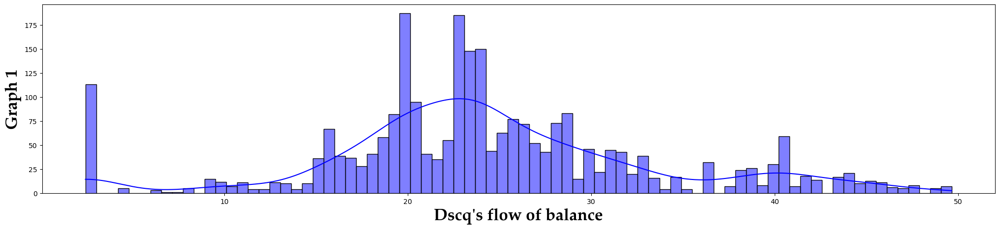

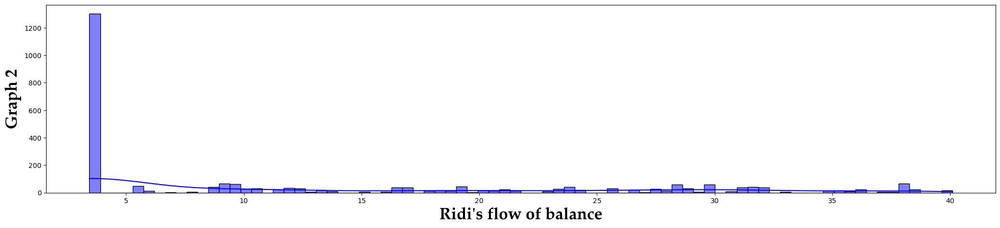

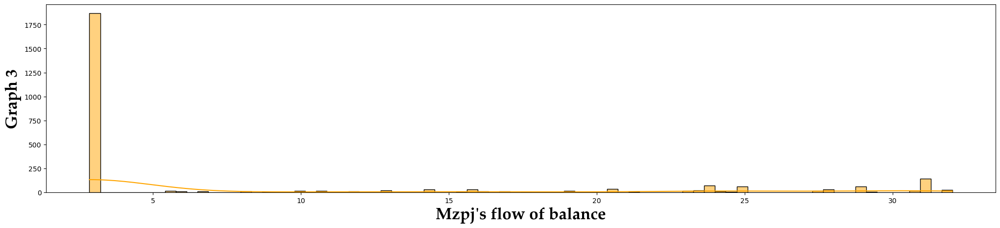

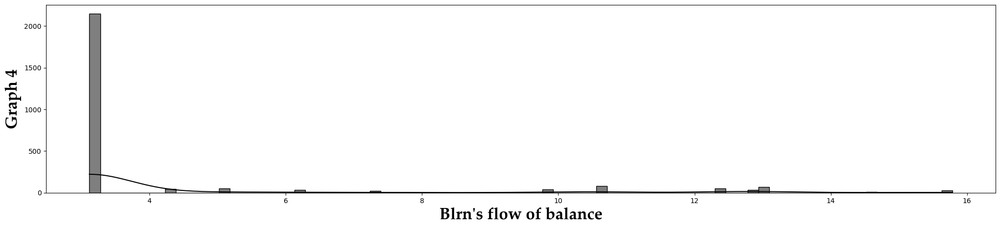

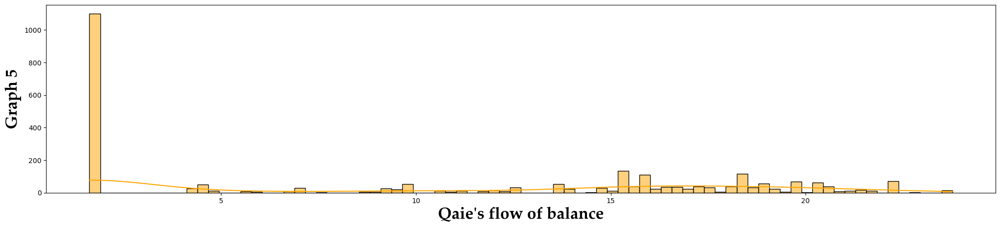

...

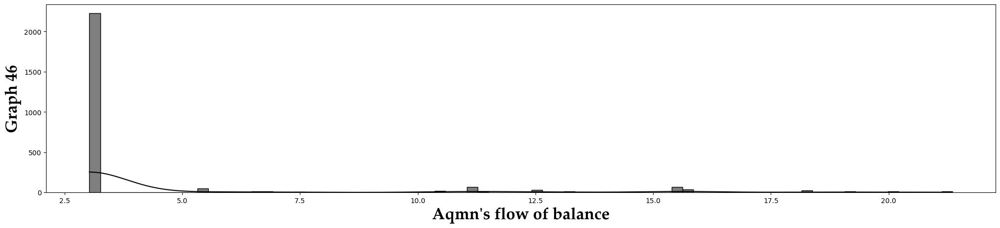

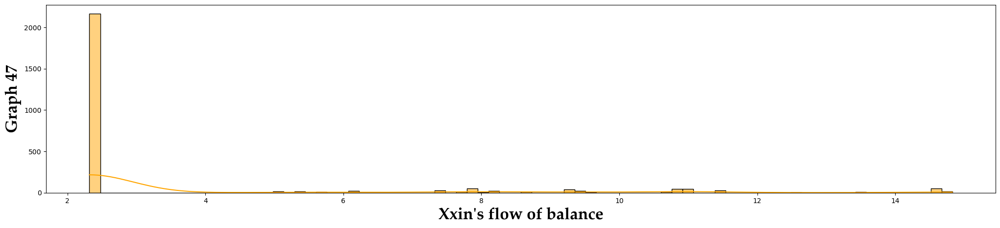

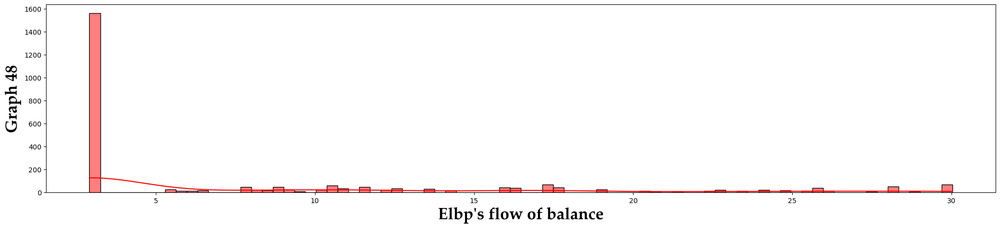

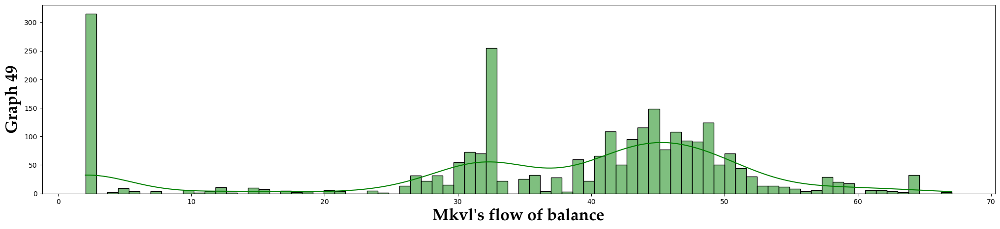

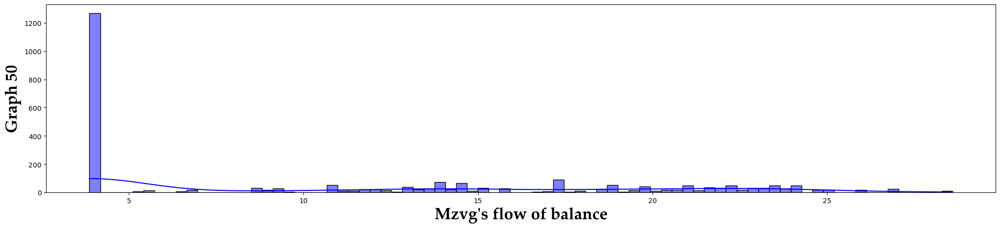

In [6]:
font = {'size':24, 'family':'Palatino Linotype', 'weight':'bold'}
for i in range(number_of_players_in_pool):
    plt.figure(figsize=(25,5))
    plott = sns.histplot(matches_df.iloc[:,12+i], kde=True, bins=80, color= random.choice(['r', 'g','b','yellow','black','orange']))
    plt.xlabel(f"{col_names[12+i]}'s flow of balance", fontdict=font)
    plt.ylabel(f"Graph {i+1}", fontdict=font)
    plt.show()
    i += 1

Text(0, 0.5, 'Count')

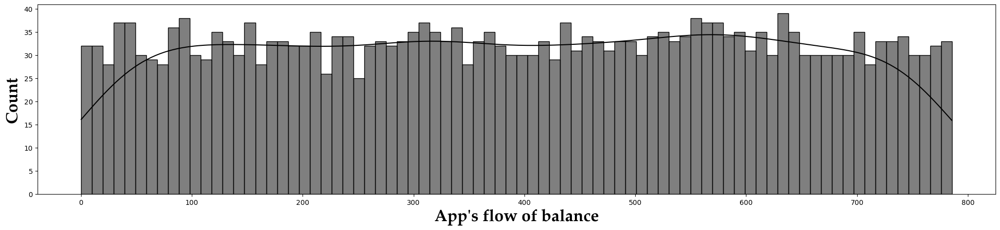

In [7]:
plt.figure(figsize=(25,5))
sns.histplot(matches_df.iloc[:,9], kde=True, bins=80, color='black')
plt.xlabel("App's flow of balance", fontdict=font)
plt.ylabel("Count", fontdict=font)

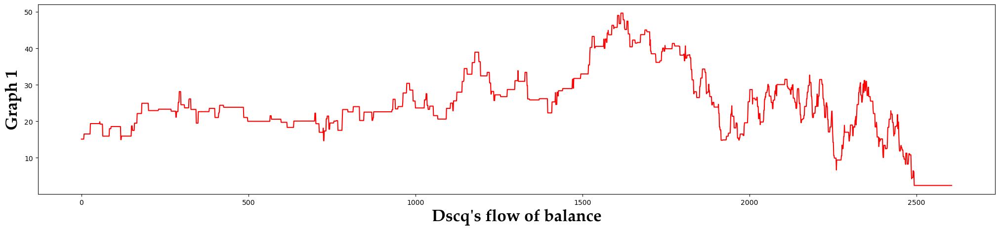

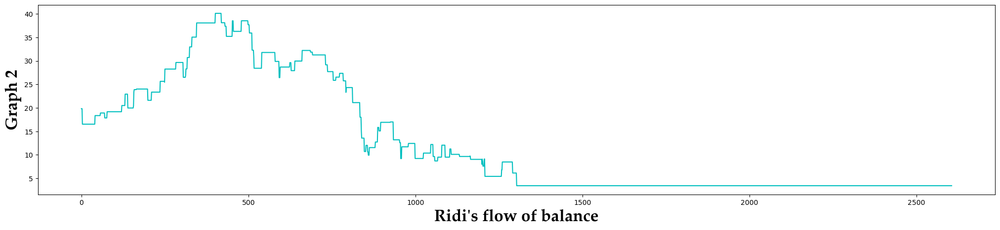

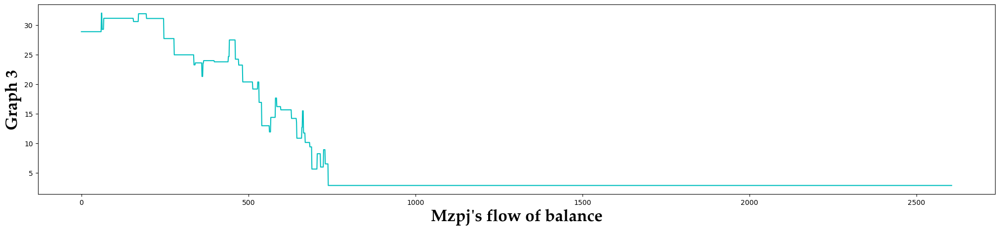

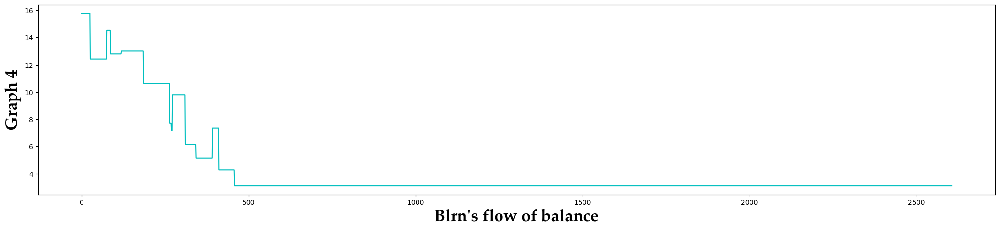

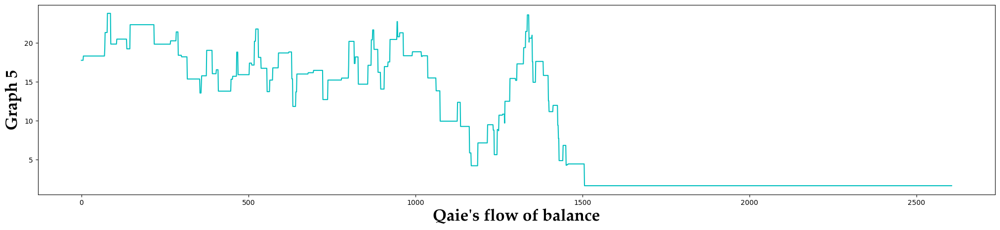

...

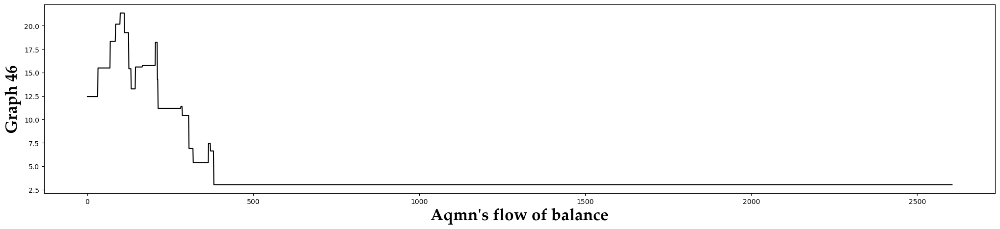

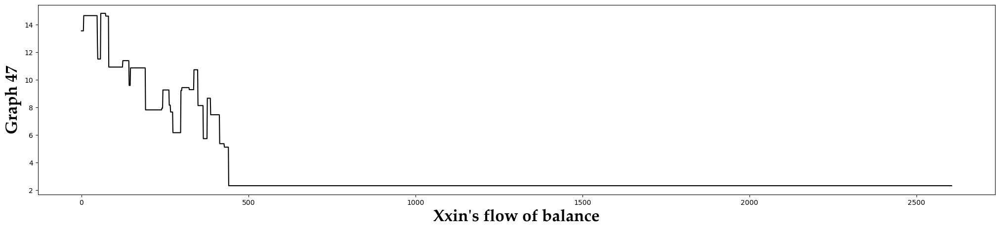

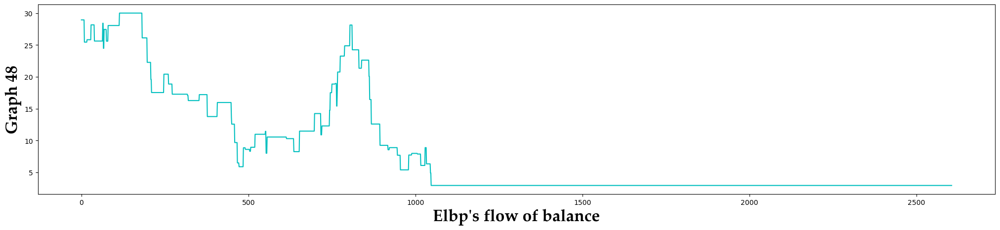

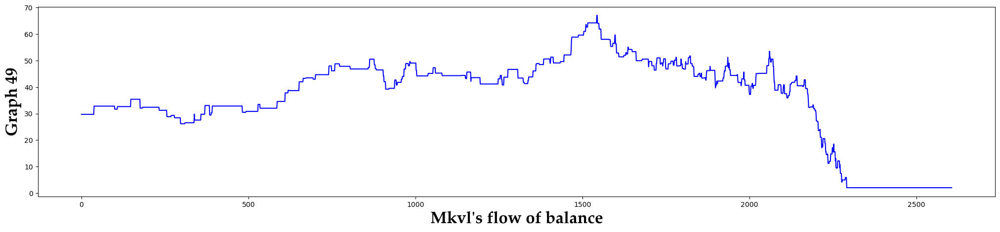

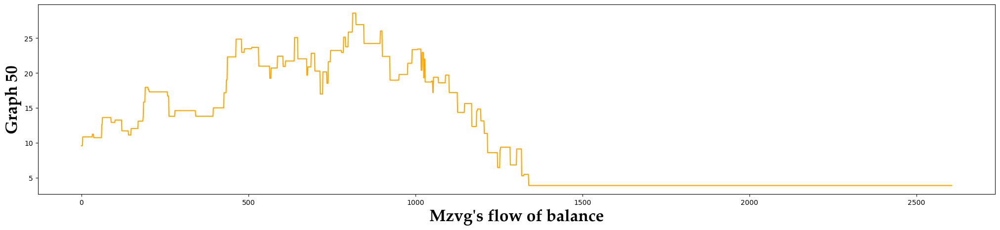

In [8]:
for i in range(number_of_players_in_pool):
    plt.figure(figsize=(25,5))
    matches_df.iloc[:,12+i].plot(kind='line', color= random.choice(['r','g','b','c','black','indigo','orange']))
    plt.xlabel(f"{col_names[12+i]}'s flow of balance", fontdict=font)
    plt.ylabel(f"Graph {i+1}", fontdict=font)
    plt.show()
    i += 1

Text(0, 0.5, 'Count')

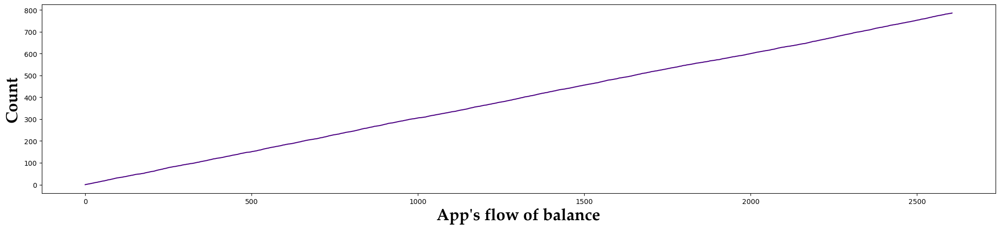

In [9]:
plt.figure(figsize=(25,5))
matches_df['Total Amount Earned by App'].plot(kind='line', color='indigo')
plt.xlabel("App's flow of balance", fontdict=font)
plt.ylabel("Count", fontdict=font)

### Linear Regression model preparation

In [10]:
predictor = matches_df.drop('Total Amount Earned by App', axis=1)

In [11]:
predictor

,Match Number,Player 1,Player 2,Loser,Winner,Points Lost by Loser,Amount Lost by Loser,Amount Remaining for Loser,Amount to be Credited to App,Amount Won by Winner,...,Iiyz,Uvtx,Uxar,Ulms,Pkdc,Aqmn,Xxin,Elbp,Mkvl,Mzvg
0,1,Jnky,Kgex,Jnky,Kgex,17,0.85,23.912,0.128,0.722,...,33.669,21.740,14.107,16.306,33.246,12.427,13.559,28.958,29.709,9.566
1,2,Kgex,Bkjw,Kgex,Bkjw,61,3.05,5.232,0.457,2.593,...,33.669,21.740,14.107,16.306,33.246,12.427,13.559,28.958,29.709,9.566
2,3,Ridi,Apql,Ridi,Apql,66,3.30,16.526,0.495,2.805,...,33.669,21.740,14.107,16.306,33.246,12.427,13.559,28.958,29.709,9.566
3,4,Yobn,Mzvg,Yobn,Mzvg,30,1.50,32.281,0.225,1.275,...,33.669,21.740,14.107,16.306,33.246,12.427,13.559,28.958,29.709,9.566
4,5,Xvgm,Vmay,Xvgm,Vmay,44,2.20,27.369,0.330,1.870,...,33.669,21.740,14.107,16.306,33.246,12.427,13.559,28.958,29.709,10.841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2601,2602,Jnky,Qsfz,Qsfz,Jnky,23,1.15,40.130,0.172,0.978,...,0.968,3.677,3.730,0.816,3.207,3.029,2.318,2.915,2.050,3.869
2602,2603,Jnky,Qsfz,Jnky,Qsfz,13,0.65,7.457,0.098,0.552,...,0.968,3.677,3.730,0.816,3.207,3.029,2.318,2.915,2.050,3.869
2603,2604,Jnky,Qsfz,Qsfz,Jnky,15,0.75,39.932,0.112,0.638,...,0.968,3.677,3.730,0.816,3.207,3.029,2.318,2.915,2.050,3.869
2604,2605,Qsfz,Jnky,Jnky,Qsfz,74,3.70,4.395,0.555,3.145,...,0.968,3.677,3.730,0.816,3.207,3.029,2.318,2.915,2.050,3.869


In [12]:
target = matches_df[['Total Amount Earned by App']]
target

,Total Amount Earned by App
0,0.128
1,0.585
2,1.080
3,1.305
4,1.635
...,...
2601,784.350
2602,784.448
2603,784.560
2604,785.115


In [13]:
cat_cols = [col for col in predictor.columns.values if predictor[col].dtype == 'object']

In [14]:
predictor_num = predictor.drop('Match Number',axis=1)

In [15]:
predictor_num = predictor_num.drop(cat_cols, axis=1)
predictor_num

,Points Lost by Loser,Amount Lost by Loser,Amount Remaining for Loser,Amount to be Credited to App,Amount Won by Winner,Amount Remaining for Winner,Dscq,Ridi,Mzpj,Blrn,...,Iiyz,Uvtx,Uxar,Ulms,Pkdc,Aqmn,Xxin,Elbp,Mkvl,Mzvg
0,17,0.85,23.912,0.128,0.722,8.282,15.125,19.826,28.873,15.785,...,33.669,21.740,14.107,16.306,33.246,12.427,13.559,28.958,29.709,9.566
1,61,3.05,5.232,0.457,2.593,34.379,15.125,19.826,28.873,15.785,...,33.669,21.740,14.107,16.306,33.246,12.427,13.559,28.958,29.709,9.566
2,66,3.30,16.526,0.495,2.805,28.628,15.125,19.826,28.873,15.785,...,33.669,21.740,14.107,16.306,33.246,12.427,13.559,28.958,29.709,9.566
3,30,1.50,32.281,0.225,1.275,10.841,15.125,16.526,28.873,15.785,...,33.669,21.740,14.107,16.306,33.246,12.427,13.559,28.958,29.709,9.566
4,44,2.20,27.369,0.330,1.870,20.512,15.125,16.526,28.873,15.785,...,33.669,21.740,14.107,16.306,33.246,12.427,13.559,28.958,29.709,10.841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2601,23,1.15,40.130,0.172,0.978,8.107,2.429,3.439,2.857,3.118,...,0.968,3.677,3.730,0.816,3.207,3.029,2.318,2.915,2.050,3.869
2602,13,0.65,7.457,0.098,0.552,40.682,2.429,3.439,2.857,3.118,...,0.968,3.677,3.730,0.816,3.207,3.029,2.318,2.915,2.050,3.869
2603,15,0.75,39.932,0.112,0.638,8.095,2.429,3.439,2.857,3.118,...,0.968,3.677,3.730,0.816,3.207,3.029,2.318,2.915,2.050,3.869
2604,74,3.70,4.395,0.555,3.145,43.077,2.429,3.439,2.857,3.118,...,0.968,3.677,3.730,0.816,3.207,3.029,2.318,2.915,2.050,3.869


### Logarithmic Transformation to convert the target's unifrom distribution to a normal distribution

In [16]:
import numpy as np

target_log = np.log1p(target)

In [17]:
target_log

,Total Amount Earned by App
0,0.120446
1,0.460584
2,0.732368
3,0.835081
4,0.968883
...,...
2601,6.666129
2602,6.666254
2603,6.666397
2604,6.667103


<Axes: ylabel='Count'>

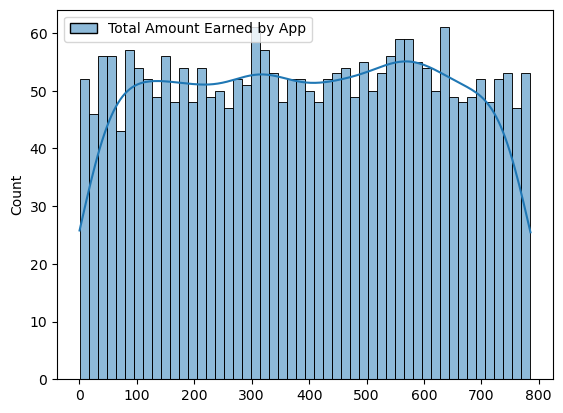

In [18]:
sns.histplot(target, kde=True, bins=50)

<Axes: ylabel='Count'>

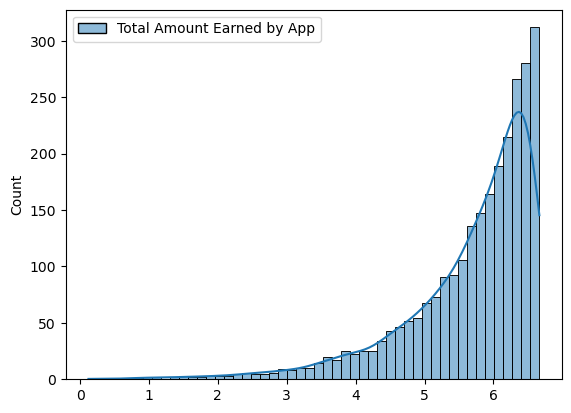

In [19]:
sns.histplot(target_log, kde=True, bins=50)

In [20]:
from sklearn.model_selection import train_test_split

X_train, x_test, Y_train, y_test = train_test_split(predictor_num.astype(float), target.astype(float), test_size=0.3, random_state=2024)

In [21]:
X_train.shape

(1824, 56)

In [22]:
x_test.shape

(782, 56)

In [23]:
Y_train.shape

(1824, 1)

In [24]:
y_test.shape

(782, 1)

In [25]:
from sklearn.linear_model import LinearRegression

lin = LinearRegression()

model1 = lin.fit(X_train, Y_train)

In [26]:
model1.score(x_test,y_test)

1.0

In [27]:
model1.coef_

array([[ 1.29252691e-01, -1.39003589e+00,  1.33226763e-15,
        -1.95017943e-01, -1.19501794e+00,  4.44089210e-15,
        -1.00000000e+00, -1.00000000e+00, -1.00000000e+00,
        -1.00000000e+00, -1.00000000e+00, -1.00000000e+00,
        -1.00000000e+00, -1.00000000e+00, -1.00000000e+00,
        -1.00000000e+00, -1.00000000e+00, -1.00000000e+00,
        -1.00000000e+00, -1.00000000e+00, -1.00000000e+00,
        -1.00000000e+00, -1.00000000e+00, -1.00000000e+00,
        -1.00000000e+00, -1.00000000e+00, -1.00000000e+00,
        -1.00000000e+00, -1.00000000e+00, -1.00000000e+00,
        -1.00000000e+00, -1.00000000e+00, -1.00000000e+00,
        -1.00000000e+00, -1.00000000e+00, -1.00000000e+00,
        -1.00000000e+00, -1.00000000e+00, -1.00000000e+00,
        -1.00000000e+00, -1.00000000e+00, -1.00000000e+00,
        -1.00000000e+00, -1.00000000e+00, -1.00000000e+00,
        -1.00000000e+00, -1.00000000e+00, -1.00000000e+00,
        -1.00000000e+00, -1.00000000e+00, -1.00000000e+0

In [28]:
model1.intercept_

array([968.77])

In [29]:
import statsmodels.api as sm
X_train = sm.add_constant(X_train)
#X_train = sm.add_constant(X_train)

model2 = sm.OLS(Y_train, X_train).fit()

In [30]:
model2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                OLS Regression Results                                
======================================================================================
Dep. Variable:     Total Amount Earned by App   R-squared:                       1.000
Model:                                    OLS   Adj. R-squared:                  1.000
Method:                         Least Squares   F-statistic:                 1.190e+28
Date:                        Tue, 25 Jun 2024   Prob (F-statistic):               0.00
Time:                                02:32:52   Log-Likelihood:                 43310.
No. Observations:                        1824   AIC:                        -8.651e+04
Df Residuals:                            1769   BIC:                        -8.621e+04
Df Model:                                  54                                         
Covariance Type:                    nonrobust                                         
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const                          968.7700   1.58e-11   6.11e+13      0.000     968.770     968.770
Points Lost by Loser             0.0249    1.5e-11   1.66e+09      0.000       0.025       0.025
Amount Lost by Loser             0.0012   7.51e-13   1.66e+09      0.000       0.001       0.001
Amount Remaining for Loser   -3.469e-15   2.46e-14     -0.141      0.888   -5.16e-14    4.47e-14
Amount to be Credited to App     0.5006   4.31e-10   1.16e+09      0.000       0.501       0.501
Amount Won by Winner            -0.4994    4.3e-10  -1.16e+09      0.000      -0.499      -0.499
Amount Remaining for Winner  -1.008e-14   2.51e-14     -0.402      0.688   -5.92e-14    3.91e-14
Dscq                            -1.0000   6.52e-14  -1.53e+13      0.000      -1.000      -1.000
Ridi                            -1.0000   2.15e-13  -4.65e+12      0.000      -1.000      -1.000
Mzpj                            -1.0000   3.49e-13  -2.87e+12      0.000      -1.000      -1.000
Blrn                            -1.0000   7.69e-13   -1.3e+12      0.000      -1.000      -1.000
Qaie                            -1.0000   1.73e-13  -5.78e+12      0.000      -1.000      -1.000
Yobn                            -1.0000   2.38e-13   -4.2e+12      0.000      -1.000      -1.000
Ggyw                            -1.0000   4.19e-13  -2.38e+12      0.000      -1.000      -1.000
Usvu                            -1.0000   5.31e-13  -1.88e+12      0.000      -1.000      -1.000
Vmay                            -1.0000   3.91e-13  -2.56e+12      0.000      -1.000      -1.000
Hqki                            -1.0000   3.13e-13   -3.2e+12      0.000      -1.000      -1.000
Jxvm                            -1.0000   2.61e-13  -3.83e+12      0.000      -1.000      -1.000
Rccp                            -1.0000    1.9e-13  -5.25e+12      0.000      -1.000      -1.000
Qsfz                            -1.0000   1.01e-13  -9.89e+12      0.000      -1.000      -1.000
Pfjb                            -1.0000   9.72e-14  -1.03e+13      0.000      -1.000      -1.000
Ndln                            -1.0000   1.43e-12  -7.02e+11      0.000      -1.000      -1.000
Ulla                            -1.0000   1.57e-12  -6.36e+11      0.000      -1.000      -1.000
Xvgm                            -1.0000   5.72e-14  -1.75e+13      0.000      -1.000      -1.000
Ezeh                            -1.0000   2.24e-13  -4.47e+12      0.000      -1.000      -1.000
Otqi                            -1.0000   4.14e-12  -2.42e+11      0.000      -1.000      -1.000
Ktav                            -1.0000   1.68e-13  -5.95e+12      0.000      -1.000      -1.000
Snpt                            -1.0000   9.41e-13  -1.06e+12      0.000      -1.000 

In [31]:
y_pred = model1.predict(x_test)

In [32]:
y_pred

array([[1.48123e+02],
       [5.67746e+02],
       [4.46539e+02],
       [9.19930e+01],
       [4.09942e+02],
       [5.46067e+02],
       [8.56880e+01],
       [4.80269e+02],
       [7.02417e+02],
       [2.57932e+02],
       [1.76711e+02],
       [3.05919e+02],
       [1.87972e+02],
       [4.37001e+02],
       [3.34906e+02],
       [6.64042e+02],
       [5.10420e+02],
       [6.05630e+01],
       [6.46893e+02],
       [3.16018e+02],
       [6.14100e+01],
       [5.88055e+02],
       [5.93387e+02],
       [6.22908e+02],
       [1.43018e+02],
       [6.59030e+01],
       [5.48622e+02],
       [1.43692e+02],
       [6.04979e+02],
       [3.64030e+01],
       [7.99460e+01],
       [9.14460e+01],
       [7.63189e+02],
       [3.79735e+02],
       [2.67888e+02],
       [1.62219e+02],
       [4.27690e+01],
       [1.39898e+02],
       [5.78676e+02],
       [3.15043e+02],
       [2.93823e+02],
       [2.82966e+02],
       [3.57134e+02],
       [1.32445e+02],
       [5.79460e+01],
       [5.

### Relationship between App's earnings and Pool's money flow

In [33]:
matches_df.columns

Index(['Match Number', 'Player 1', 'Player 2', 'Loser', 'Winner',
       'Points Lost by Loser', 'Amount Lost by Loser',
       'Amount Remaining for Loser', 'Amount to be Credited to App',
       'Total Amount Earned by App', 'Amount Won by Winner',
       'Amount Remaining for Winner', 'Dscq', 'Ridi', 'Mzpj', 'Blrn', 'Qaie',
       'Yobn', 'Ggyw', 'Usvu', 'Vmay', 'Hqki', 'Jxvm', 'Rccp', 'Qsfz', 'Pfjb',
       'Ndln', 'Ulla', 'Xvgm', 'Ezeh', 'Otqi', 'Ktav', 'Snpt', 'Kopp', 'Bkjw',
       'Rclp', 'Ihqc', 'Kqkk', 'Zfbl', 'Qtxb', 'Rpdx', 'Fhzm', 'Oumn', 'Qngh',
       'Apql', 'Kgex', 'Vnso', 'Tgtx', 'Bdgy', 'Jnky', 'Uzjm', 'Dhpk', 'Iiyz',
       'Uvtx', 'Uxar', 'Ulms', 'Pkdc', 'Aqmn', 'Xxin', 'Elbp', 'Mkvl', 'Mzvg'],
      dtype='object')

In [34]:
matches_df_comparison = matches_df.drop(['Match Number', 'Player 1', 'Player 2', 'Loser', 'Winner',
       'Points Lost by Loser', 'Amount Lost by Loser',
       'Amount Remaining for Loser', 'Amount to be Credited to App','Amount Won by Winner',
       'Amount Remaining for Winner'], axis=1)

In [35]:
sum_all = matches_df_comparison.drop('Total Amount Earned by App', axis=1)

In [36]:
sum_all.shape

(2606, 50)

In [37]:
matches_df_comparison['Amount involved in the pool each match'] = sum_all.sum(axis=1)

In [38]:
matches_df_comparison

,Total Amount Earned by App,Dscq,Ridi,Mzpj,Blrn,Qaie,Yobn,Ggyw,Usvu,Vmay,...,Uvtx,Uxar,Ulms,Pkdc,Aqmn,Xxin,Elbp,Mkvl,Mzvg,Amount involved in the pool each match
0,0.128,15.125,19.826,28.873,15.785,17.733,33.781,19.363,15.516,18.642,...,21.740,14.107,16.306,33.246,12.427,13.559,28.958,29.709,9.566,968.770
1,0.585,15.125,19.826,28.873,15.785,17.733,33.781,19.363,15.516,18.642,...,21.740,14.107,16.306,33.246,12.427,13.559,28.958,29.709,9.566,968.642
2,1.080,15.125,19.826,28.873,15.785,17.733,33.781,19.363,15.516,18.642,...,21.740,14.107,16.306,33.246,12.427,13.559,28.958,29.709,9.566,968.185
3,1.305,15.125,16.526,28.873,15.785,17.733,33.781,19.363,15.516,18.642,...,21.740,14.107,16.306,33.246,12.427,13.559,28.958,29.709,9.566,967.690
4,1.635,15.125,16.526,28.873,15.785,17.733,32.281,19.363,15.516,18.642,...,21.740,14.107,16.306,33.246,12.427,13.559,28.958,29.709,10.841,967.465
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2601,784.350,2.429,3.439,2.857,3.118,1.621,3.525,1.864,2.207,2.863,...,3.677,3.730,0.816,3.207,3.029,2.318,2.915,2.050,3.869,184.592
2602,784.448,2.429,3.439,2.857,3.118,1.621,3.525,1.864,2.207,2.863,...,3.677,3.730,0.816,3.207,3.029,2.318,2.915,2.050,3.869,184.420
2603,784.560,2.429,3.439,2.857,3.118,1.621,3.525,1.864,2.207,2.863,...,3.677,3.730,0.816,3.207,3.029,2.318,2.915,2.050,3.869,184.322
2604,785.115,2.429,3.439,2.857,3.118,1.621,3.525,1.864,2.207,2.863,...,3.677,3.730,0.816,3.207,3.029,2.318,2.915,2.050,3.869,184.210


(<seaborn.axisgrid.FacetGrid at 0x2bc34bdb110>,
 <seaborn.axisgrid.FacetGrid at 0x2bc34b97050>)

<Figure size 500x500 with 0 Axes>

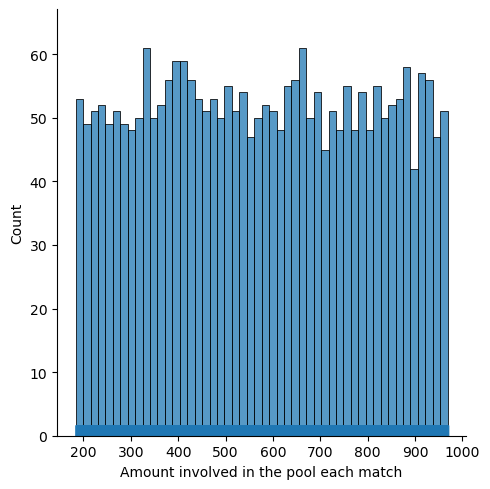

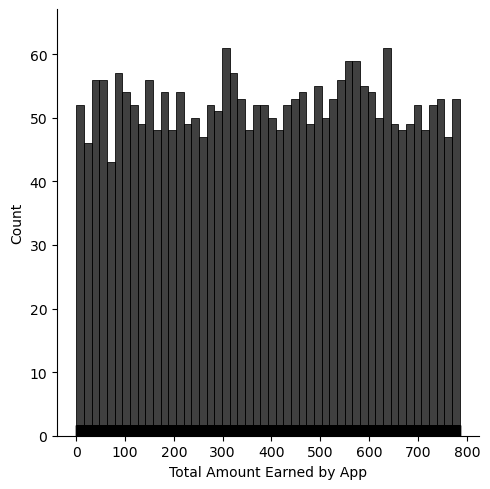

In [39]:
plt.figure(figsize=(5,5))

sns.displot(data=matches_df_comparison, x='Amount involved in the pool each match',rug=True, bins=50), sns.displot(data=matches_df_comparison, x='Total Amount Earned by App', color='black', rug=True, bins=50)

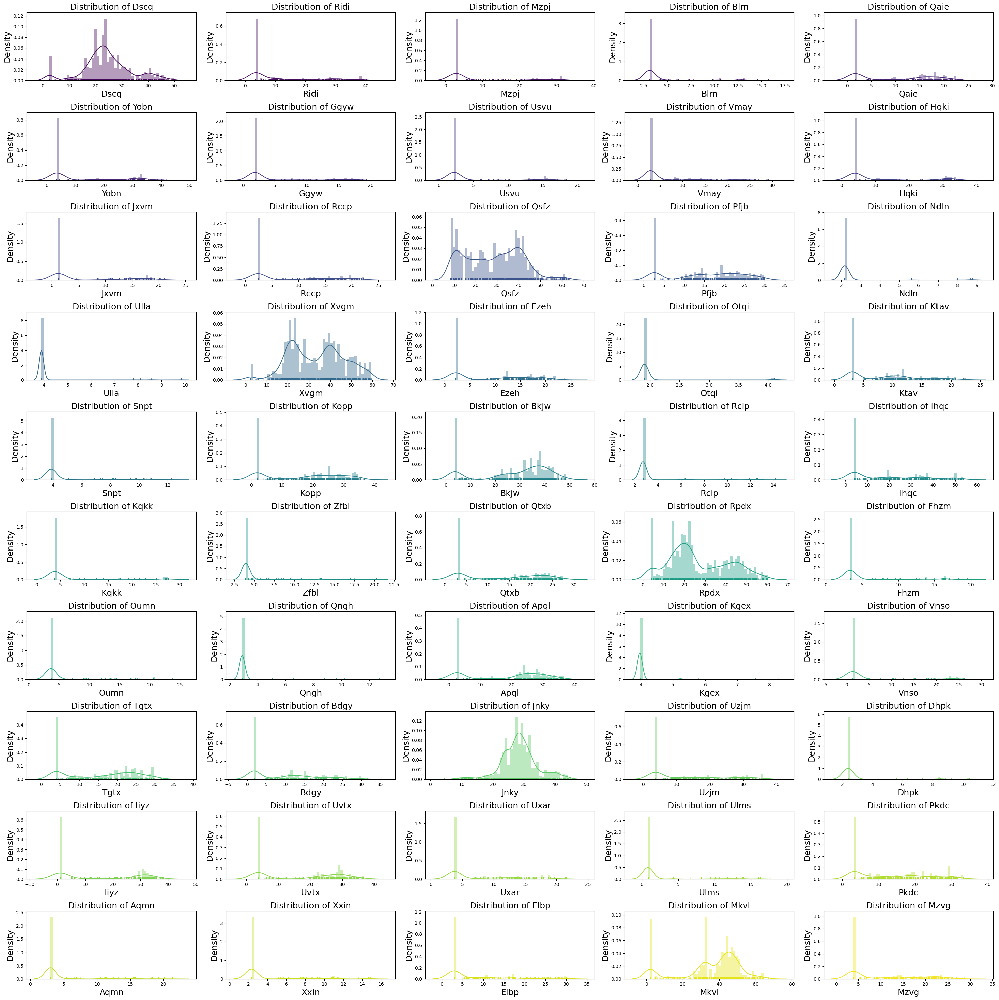

In [40]:
palette = sns.color_palette("viridis", len(sum_all.columns))

# Plotting using seaborn
fig, axes = plt.subplots(nrows=10, ncols=5, figsize=(30, 30))  # Adjust figsize as needed
axes = axes.flatten()  # Flatten the 2D array of axes to simplify iteration

for i, (column, color) in enumerate(zip(sum_all.columns, palette)):
    sns.distplot(sum_all[column], ax=axes[i], rug=True, bins=50, color=color,)
    axes[i].set_title(f'Distribution of {column}', fontsize=18)
    axes[i].set_xlabel(column, fontsize=18)
    axes[i].set_ylabel('Density', fontsize=18)

# Adjust layout
plt.tight_layout()
plt.show()

In [47]:
matches_df_comparison.columns

Index(['Total Amount Earned by App', 'Dscq', 'Ridi', 'Mzpj', 'Blrn', 'Qaie',
       'Yobn', 'Ggyw', 'Usvu', 'Vmay', 'Hqki', 'Jxvm', 'Rccp', 'Qsfz', 'Pfjb',
       'Ndln', 'Ulla', 'Xvgm', 'Ezeh', 'Otqi', 'Ktav', 'Snpt', 'Kopp', 'Bkjw',
       'Rclp', 'Ihqc', 'Kqkk', 'Zfbl', 'Qtxb', 'Rpdx', 'Fhzm', 'Oumn', 'Qngh',
       'Apql', 'Kgex', 'Vnso', 'Tgtx', 'Bdgy', 'Jnky', 'Uzjm', 'Dhpk', 'Iiyz',
       'Uvtx', 'Uxar', 'Ulms', 'Pkdc', 'Aqmn', 'Xxin', 'Elbp', 'Mkvl', 'Mzvg',
       'Amount involved in the pool each match'],
      dtype='object')

In [71]:
Percentage_of_earnings_for_app = matches_df_comparison['Total Amount Earned by App'].iloc[-1]/matches_df_comparison['Amount involved in the pool each match'].iloc[0]
Percentage_of_earnings_for_app

0.8108818398587879

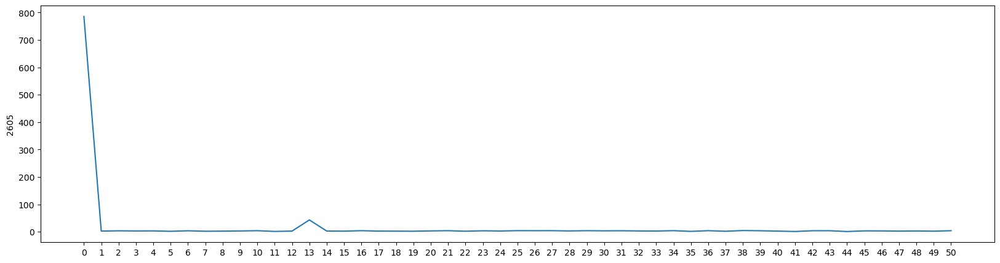

In [131]:
matches_df_pie = matches_df_comparison.drop('Amount involved in the pool each match', axis=1)
current_columns = matches_df_pie.columns.tolist()

new_columns = [f"{i}" for i in range(len(current_columns))]

matches_df_pie.columns = new_columns
plt.figure(figsize=(20,5))
sns.lineplot(matches_df_pie.iloc[-1]);

In [128]:
matches_df_comparison.columns[13]

'Qsfz'

In [129]:
matches_df_comparison.columns[0]

'Total Amount Earned by App'

In [63]:
matches_df_pie.shape

(2606, 51)

In [41]:
%store matches_df

Stored 'matches_df' (DataFrame)


In [42]:
%store number_of_players_in_pool

Stored 'number_of_players_in_pool' (int)


In [43]:
%store totalPlayers

Stored 'totalPlayers' (dict)


In [44]:
players = list(totalPlayers.keys())
players.append('Total Amount Earned by App')

In [45]:
players

['Dscq',
 'Ridi',
 'Mzpj',
 'Blrn',
 'Qaie',
 'Yobn',
 'Ggyw',
 'Usvu',
 'Vmay',
 'Hqki',
 'Jxvm',
 'Rccp',
 'Qsfz',
 'Pfjb',
 'Ndln',
 'Ulla',
 'Xvgm',
 'Ezeh',
 'Otqi',
 'Ktav',
 'Snpt',
 'Kopp',
 'Bkjw',
 'Rclp',
 'Ihqc',
 'Kqkk',
 'Zfbl',
 'Qtxb',
 'Rpdx',
 'Fhzm',
 'Oumn',
 'Qngh',
 'Apql',
 'Kgex',
 'Vnso',
 'Tgtx',
 'Bdgy',
 'Jnky',
 'Uzjm',
 'Dhpk',
 'Iiyz',
 'Uvtx',
 'Uxar',
 'Ulms',
 'Pkdc',
 'Aqmn',
 'Xxin',
 'Elbp',
 'Mkvl',
 'Mzvg',
 'Total Amount Earned by App']